In [1]:
import pandas as pd
import datetime, calendar
import folium

In [3]:
df=pd.read_csv("dataset.csv")

In [3]:
df.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499..."
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351..."
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)..."
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705..."
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)..."


### Let's talk about the different columns
---
- CALL_TYPE: The way used to demand taxi service
    - 'A' : if this trip was dispatched from the central
    - 'B' : if this trip was demanded directly to a taxi driver on a specific stand 
    - 'C' : other (i.e. a trip demanded on a random street)

- TIMESTAMP: When the trip starts 

- TRIP_PATH: Contains a list of coordinates
    - The first element is the coordinates of the trip's starting point
    - The last element is the coordinates of the trip's end point

<h1>Data Processing</h1>

In [4]:
eval(df.TRIP_PATH.iloc[0])

[(41.141412, -8.618643),
 (41.141376, -8.618499),
 (41.14251, -8.620326),
 (41.143815, -8.622153),
 (41.144373, -8.623953),
 (41.144778, -8.62668),
 (41.144697, -8.627373),
 (41.14521, -8.630226),
 (41.14692, -8.632746),
 (41.148225, -8.631738),
 (41.150385, -8.629938),
 (41.151213, -8.62911),
 (41.15124, -8.629128),
 (41.152203, -8.628786),
 (41.152374, -8.628687),
 (41.152518, -8.628759),
 (41.15268, -8.630838),
 (41.153022, -8.632323),
 (41.154489, -8.631144),
 (41.154507, -8.630829),
 (41.154516, -8.630829),
 (41.154498, -8.630829),
 (41.154489, -8.630838)]

In [17]:
df.TRIP_PATH=df.TRIP_PATH.apply(eval)

In [18]:
df

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...",[,]
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...",[,]
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...",[,]
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...",[,]
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...",[,]
...,...,...,...,...,...,...
9995,1372840956620000118,C,1372840956,"[(41.159718, -8.577468), (41.160159, -8.576262...",[,]
9996,1372841563620000304,C,1372841563,"[(41.162616, -8.623656)]",[,]
9997,1372836480620000341,C,1372836480,"[(41.150934, -8.598915), (41.150835, -8.598654...",[,]
9998,1372838570620000387,C,1372838570,"[(41.14845, -8.648793), (41.148378, -8.648685)...",[,]


In [19]:
df.TRIP_PATH.iloc[0]

[(41.141412, -8.618643),
 (41.141376, -8.618499),
 (41.14251, -8.620326),
 (41.143815, -8.622153),
 (41.144373, -8.623953),
 (41.144778, -8.62668),
 (41.144697, -8.627373),
 (41.14521, -8.630226),
 (41.14692, -8.632746),
 (41.148225, -8.631738),
 (41.150385, -8.629938),
 (41.151213, -8.62911),
 (41.15124, -8.629128),
 (41.152203, -8.628786),
 (41.152374, -8.628687),
 (41.152518, -8.628759),
 (41.15268, -8.630838),
 (41.153022, -8.632323),
 (41.154489, -8.631144),
 (41.154507, -8.630829),
 (41.154516, -8.630829),
 (41.154498, -8.630829),
 (41.154489, -8.630838)]

In [20]:
extract_start_point= lambda list_: list_[0]
extract_end_point= lambda list_: list_[-1]
df["Start"]=df.TRIP_PATH.apply(extract_start_point)
df["end"]= df.TRIP_PATH.apply(extract_end_point)

df.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end
0,1372636858620000589,C,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,B,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,C,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,C,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,C,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"


In [21]:
CALL_TYPES = {
              "A":"CENTRAL_BASED",
              "B":"STAND_BASED",
              "C":"OTHER"
             }

df.CALL_TYPE.map(CALL_TYPES)

0               OTHER
1         STAND_BASED
2               OTHER
3               OTHER
4               OTHER
            ...      
9995            OTHER
9996            OTHER
9997            OTHER
9998            OTHER
9999    CENTRAL_BASED
Name: CALL_TYPE, Length: 10000, dtype: object

In [22]:
CALL_TYPES = {
              "A":"CENTRAL_BASED",
              "B":"STAND_BASED",
              "C":"OTHER"
             }

df["CALL_TYPE"]=df.CALL_TYPE.map(CALL_TYPES)

<Axes: xlabel='CALL_TYPE'>

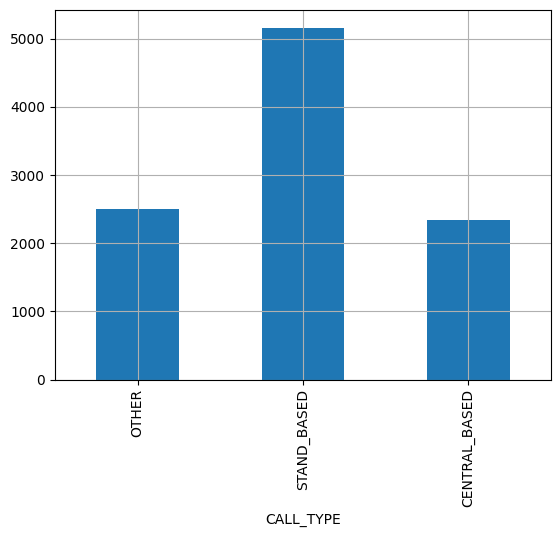

In [23]:
q1_data=df.CALL_TYPE.value_counts(sort=False)
q1_data.plot.bar(grid=True)

# TASK 3

### Question 2 - Which regions of the city are the best pick up points?
    To answer to this question we can use a dotmap.
    A dotmap is a scatter plot which is put on a map to represent a geographic data distribution.
    And then by looking at the different clusters of the points on the map we can get the answer.

In [24]:
map= folium.Map() #default : world map
map

In [25]:
map_D= folium.Map(location= [28.7041,77.1025]) # no degree
map_D

In [26]:
map_D= folium.Map(location= [28.7041,77.1025], zoom_start= 12) # zoom_start for more zooming 
map_D

In [27]:
df

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)"
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)"
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)"
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)"
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)"
...,...,...,...,...,...,...
9995,1372840956620000118,OTHER,1372840956,"[(41.159718, -8.577468), (41.160159, -8.576262...","(41.159718, -8.577468)","(41.152698, -8.567109)"
9996,1372841563620000304,OTHER,1372841563,"[(41.162616, -8.623656)]","(41.162616, -8.623656)","(41.162616, -8.623656)"
9997,1372836480620000341,OTHER,1372836480,"[(41.150934, -8.598915), (41.150835, -8.598654...","(41.150934, -8.598915)","(41.140134, -8.536419)"
9998,1372838570620000387,OTHER,1372838570,"[(41.14845, -8.648793), (41.148378, -8.648685)...","(41.14845, -8.648793)","(41.159403, -8.681292)"


In [24]:
#putting point on a map (as course says)

In [28]:
map_porto= folium.Map(location= [41.15,-8.62]) # no degree

point= df.Start.iloc[0]
folium.CircleMarker(location=[41.15,-8.62], color="blue", radius=10, weight=2).add_to(map_porto)
#add to function is used to concate the point with map_porto

map_porto

In [29]:
map_porto= folium.Map(location= [41.15,-8.62]) # no degree

for point in df.Start:
    folium.CircleMarker(location=point, color="blue", radius=5, weight=2).add_to(map_porto)
#add to function is used to concate the point with map_porto

map_porto

### Question 3 - Which regions of the city are the best pick up points for stand-based trips?
    To answer to this question we create a dotmap with different Marker clusters, each cluster corresponds to a specific
    CALL_TYPE.

In [29]:
df.CALL_TYPE.unique()

array(['OTHER', 'STAND_BASED', 'CENTRAL_BASED'], dtype=object)

In [30]:
stand_based_map= folium.Map(location=[41.15,-8.62], zoom_start=14, )

colors={
    "OTHER": "red", 
    "STAND_BASED": "blue",
    "CENTRAL_BASED": "purple"
}

data= df[["CALL_TYPE","Start"]]
data
for index, row in data.iterrows():
    color= colors[row["CALL_TYPE"]]
    location= row["Start"]
    folium.CircleMarker(location, color=color, radius=4 , weight= 2).add_to(stand_based_map)

stand_based_map

In [33]:
df.TIMESTAMP

0       1372636858
1       1372637303
2       1372636951
3       1372636854
4       1372637091
           ...    
9995    1372840956
9996    1372841563
9997    1372836480
9998    1372838570
9999    1372837696
Name: TIMESTAMP, Length: 10000, dtype: int64

<h2>converting timestamp into date and days</h2>

In [31]:
datetime.datetime.fromtimestamp(df.TIMESTAMP.iloc[2])

datetime.datetime(2013, 7, 1, 5, 32, 31)

In [39]:
datetime.datetime.fromtimestamp(df.TIMESTAMP.iloc[2]).day

1

In [40]:
datetime.datetime.fromtimestamp(df.TIMESTAMP.iloc[2]).month

7

In [42]:
datetime.datetime.fromtimestamp(df.TIMESTAMP.iloc[2]).time()

datetime.time(5, 32, 31)

In [43]:
datetime.datetime.fromtimestamp(df.TIMESTAMP.iloc[2]).weekday()

0

In [50]:
list(calendar.day_name)

['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

In [32]:
day_names= list(calendar.day_name)
get_day= lambda timestamp: day_names[datetime.datetime.fromtimestamp(timestamp).weekday()]
df.TIMESTAMP.apply(get_day)

0          Monday
1          Monday
2          Monday
3          Monday
4          Monday
          ...    
9995    Wednesday
9996    Wednesday
9997    Wednesday
9998    Wednesday
9999    Wednesday
Name: TIMESTAMP, Length: 10000, dtype: object

In [33]:
df["Week_Day"]=df.TIMESTAMP.apply(get_day)
df

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end,Week_Day
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday
...,...,...,...,...,...,...,...
9995,1372840956620000118,OTHER,1372840956,"[(41.159718, -8.577468), (41.160159, -8.576262...","(41.159718, -8.577468)","(41.152698, -8.567109)",Wednesday
9996,1372841563620000304,OTHER,1372841563,"[(41.162616, -8.623656)]","(41.162616, -8.623656)","(41.162616, -8.623656)",Wednesday
9997,1372836480620000341,OTHER,1372836480,"[(41.150934, -8.598915), (41.150835, -8.598654...","(41.150934, -8.598915)","(41.140134, -8.536419)",Wednesday
9998,1372838570620000387,OTHER,1372838570,"[(41.14845, -8.648793), (41.148378, -8.648685)...","(41.14845, -8.648793)","(41.159403, -8.681292)",Wednesday


In [54]:
df.Week_Day.unique()

array(['Monday', 'Tuesday', 'Wednesday'], dtype=object)

In [34]:
df[df.Week_Day=="Monday"]

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end,Week_Day
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday
...,...,...,...,...,...,...,...
7406,1372691204620000651,CENTRAL_BASED,1372691204,"[(41.152797, -8.605647), (41.153031, -8.605647...","(41.152797, -8.605647)","(41.14881, -8.585685)",Monday
7834,1372660371620000606,CENTRAL_BASED,1372660371,"[(41.159097, -8.611974), (41.159349, -8.611938...","(41.159097, -8.611974)","(41.155533, -8.627904)",Monday
8471,1372654126620000173,CENTRAL_BASED,1372654126,"[(41.181444, -8.583687), (41.180301, -8.586063...","(41.181444, -8.583687)","(41.148891, -8.585613)",Monday
9302,1372694411620000529,OTHER,1372694411,"[(41.155542, -8.628552), (41.155713, -8.627823...","(41.155542, -8.628552)","(41.166216, -8.606403)",Monday


In [36]:
mon=df[df.Week_Day=="Monday"]

In [37]:
mon_map= folium.Map(location=[41.15,-8.62],zoom_start=14)
for loc in mon.end:
    folium.CircleMarker(loc,color="black",radius=4,weight=2).add_to(mon_map)
mon_map

### Question 5 - What are the most common start and end points on Monday Mornings (from 6 am to 9 am)?
    To answer to this question we need to extract the hour information for each of the trips. 

In [38]:
extract_hour= lambda timestamp: datetime.datetime.fromtimestamp(timestamp).hour

df.TIMESTAMP.apply(extract_hour)

0        5
1        5
2        5
3        5
4        5
        ..
9995    14
9996    14
9997    12
9998    13
9999    13
Name: TIMESTAMP, Length: 10000, dtype: int64

In [39]:
df["hour"]=df.TIMESTAMP.apply(extract_hour)
df

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end,Week_Day,hour
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday,5
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday,5
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday,5
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday,5
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday,5
...,...,...,...,...,...,...,...,...
9995,1372840956620000118,OTHER,1372840956,"[(41.159718, -8.577468), (41.160159, -8.576262...","(41.159718, -8.577468)","(41.152698, -8.567109)",Wednesday,14
9996,1372841563620000304,OTHER,1372841563,"[(41.162616, -8.623656)]","(41.162616, -8.623656)","(41.162616, -8.623656)",Wednesday,14
9997,1372836480620000341,OTHER,1372836480,"[(41.150934, -8.598915), (41.150835, -8.598654...","(41.150934, -8.598915)","(41.140134, -8.536419)",Wednesday,12
9998,1372838570620000387,OTHER,1372838570,"[(41.14845, -8.648793), (41.148378, -8.648685)...","(41.14845, -8.648793)","(41.159403, -8.681292)",Wednesday,13


In [65]:
df.hour.unique()

array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23,  0,  1,  2,  3,  4], dtype=int64)

In [40]:
#df[df.hour.isin([6,7,8,9]) && df.Week_Day=="Monday"]
df[(df.Week_Day=="Monday") & (df.hour.isin([7,8,9])) ]

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end,Week_Day,hour
54,1372642886620000403,STAND_BASED,1372642886,"[(41.145786, -8.610912)]","(41.145786, -8.610912)","(41.145786, -8.610912)",Monday,7
58,1372642706620000653,STAND_BASED,1372642706,"[(41.157378, -8.628327), (41.157801, -8.627994...","(41.157378, -8.628327)","(41.164209, -8.623071)",Monday,7
65,1372643618620000463,STAND_BASED,1372643618,"[(41.140764, -8.615394), (41.14143, -8.614467)...","(41.140764, -8.615394)","(41.147019, -8.620146)",Monday,7
71,1372643656620000492,OTHER,1372643656,"[(41.161221, -8.605017), (41.160807, -8.605188...","(41.161221, -8.605017)","(41.153346, -8.651862)",Monday,7
75,1372644235620000520,OTHER,1372644235,"[(41.150385, -8.611569), (41.150331, -8.61201)...","(41.150385, -8.611569)","(41.147325, -8.602524)",Monday,7
...,...,...,...,...,...,...,...,...
645,1372648756620000481,CENTRAL_BASED,1372648756,"[(41.182353, -8.596935), (41.183586, -8.596917...","(41.182353, -8.596935)","(41.236488, -8.669835)",Monday,8
950,1372652369620000423,CENTRAL_BASED,1372652369,"[(41.149593, -8.635482), (41.149584, -8.635059...","(41.149593, -8.635482)","(41.152779, -8.614953)",Monday,9
1035,1372646014620000611,OTHER,1372646014,"[(41.137722, -8.587566), (41.137578, -8.587584...","(41.137722, -8.587566)","(41.181606, -8.655903)",Monday,8
1176,1372651042620000171,CENTRAL_BASED,1372651042,"[(41.159934, -8.611686), (41.159934, -8.611677...","(41.159934, -8.611686)","(41.237577, -8.670276)",Monday,9


In [41]:
new= df[(df.Week_Day=="Monday") & (df.hour.isin([7,8,9])) ]

In [42]:
new_map= folium.Map(location=[41.15,-8.62],zoom_start=14)
put_start= lambda loc: folium.CircleMarker(loc,color="red", radius=4, weight=2).add_to(new_map)
put_end = lambda loc: folium.CircleMarker(loc,color="blue", radius=4, weight=2).add_to(new_map)
new.Start.apply(put_start)
new.end.apply(put_end)
new_map

## TASK 5
### Question 6 - Find out the rush hour in Porto

In [81]:
df.head()

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end,Week_Day,hour
0,1372636858620000589,OTHER,1372636858,"[(41.141412, -8.618643), (41.141376, -8.618499...","(41.141412, -8.618643)","(41.154489, -8.630838)",Monday,5
1,1372637303620000596,STAND_BASED,1372637303,"[(41.159826, -8.639847), (41.159871, -8.640351...","(41.159826, -8.639847)","(41.170671, -8.66574)",Monday,5
2,1372636951620000320,OTHER,1372636951,"[(41.140359, -8.612964), (41.14035, -8.613378)...","(41.140359, -8.612964)","(41.14053, -8.61597)",Monday,5
3,1372636854620000520,OTHER,1372636854,"[(41.151951, -8.574678), (41.151942, -8.574705...","(41.151951, -8.574678)","(41.142915, -8.607996)",Monday,5
4,1372637091620000337,OTHER,1372637091,"[(41.18049, -8.645994), (41.180517, -8.645949)...","(41.18049, -8.645994)","(41.178087, -8.687268)",Monday,5


In [83]:
df.hour.value_counts()

hour
13    725
14    694
15    683
19    605
20    596
18    567
21    556
12    525
17    524
22    506
16    496
23    452
0     350
1     303
2     297
11    275
5     272
9     265
8     254
3     247
10    226
6     205
7     193
4     184
Name: count, dtype: int64

<Axes: xlabel='hour'>

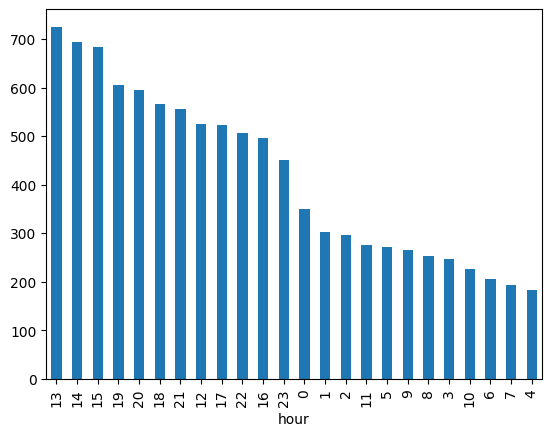

In [89]:
df.hour.value_counts().plot.bar(sorted)

In [93]:
df.hour.value_counts().sort_values()

hour
4     184
7     193
6     205
10    226
3     247
8     254
9     265
5     272
11    275
2     297
1     303
0     350
23    452
16    496
22    506
17    524
12    525
21    556
18    567
20    596
19    605
15    683
14    694
13    725
Name: count, dtype: int64

In [94]:
df.hour.value_counts().sort_index()

hour
0     350
1     303
2     297
3     247
4     184
5     272
6     205
7     193
8     254
9     265
10    226
11    275
12    525
13    725
14    694
15    683
16    496
17    524
18    567
19    605
20    596
21    556
22    506
23    452
Name: count, dtype: int64

<Axes: xlabel='hour'>

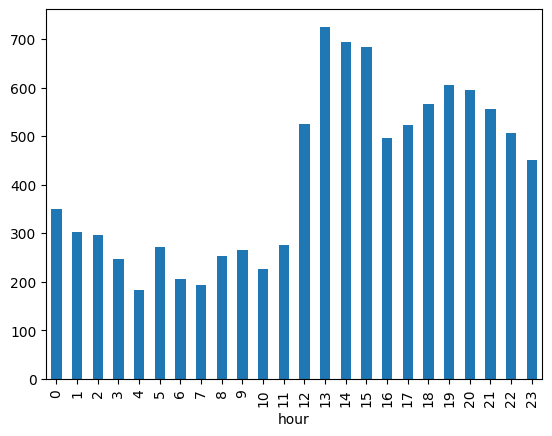

In [97]:
df.hour.value_counts().sort_index().plot.bar()

### Question 7 - Which streets has the more traffic during the rush hour
    To answer to this question we need to use TRIP_PATH column to visualize each path as a line on the map.
    Firstly, let's filter out the needed data. 

In [43]:
df[df.hour==13]

,TRIP_ID,CALL_TYPE,TIMESTAMP,TRIP_PATH,Start,end,Week_Day,hour
500,1372664268620000517,STAND_BASED,1372664268,"[(41.145624, -8.610876), (41.145714, -8.610912...","(41.145624, -8.610876)","(41.147154, -8.622414)",Monday,13
512,1372664498620000144,STAND_BASED,1372664498,"[(41.145606, -8.610795), (41.145597, -8.610813...","(41.145606, -8.610795)","(41.147649, -8.62011)",Monday,13
535,1372664679620000186,OTHER,1372664679,"[(41.162499, -8.615457), (41.162481, -8.615412...","(41.162499, -8.615457)","(41.162382, -8.615511)",Monday,13
555,1372664210620000192,OTHER,1372664210,"[(41.164074, -8.662554), (41.164056, -8.662482...","(41.164074, -8.662554)","(41.150988, -8.632908)",Monday,13
560,1372663906620000344,STAND_BASED,1372663906,"[(41.157288, -8.628102), (41.157405, -8.628066...","(41.157288, -8.628102)","(41.185647, -8.645895)",Monday,13
...,...,...,...,...,...,...,...,...
9990,1372838548620000596,STAND_BASED,1372838548,"[(41.159745, -8.639937), (41.159754, -8.639928...","(41.159745, -8.639937)","(41.16231, -8.608284)",Wednesday,13
9991,1372839082620000146,CENTRAL_BASED,1372839082,"[(41.164857, -8.583156), (41.164623, -8.583102...","(41.164857, -8.583156)","(41.141457, -8.615376)",Wednesday,13
9992,1372839296620000665,OTHER,1372839296,"[(41.147964, -8.607852), (41.148243, -8.607996...","(41.147964, -8.607852)","(41.157486, -8.625861)",Wednesday,13
9998,1372838570620000387,OTHER,1372838570,"[(41.14845, -8.648793), (41.148378, -8.648685)...","(41.14845, -8.648793)","(41.159403, -8.681292)",Wednesday,13


In [44]:
rush= df[df.hour==13]

In [45]:
rush.TRIP_PATH.iloc[0]

[(41.145624, -8.610876),
 (41.145714, -8.610912),
 (41.145705, -8.610813),
 (41.14602, -8.610561),
 (41.146425, -8.610057),
 (41.146587, -8.609787),
 (41.146677, -8.609265),
 (41.14701, -8.608941),
 (41.147082, -8.608824),
 (41.147406, -8.608716),
 (41.147487, -8.608932),
 (41.147901, -8.610237),
 (41.14782, -8.6103),
 (41.14782, -8.610462),
 (41.147955, -8.611641),
 (41.14836, -8.613342),
 (41.147622, -8.622045),
 (41.147667, -8.622117),
 (41.14746, -8.622288),
 (41.147154, -8.622405),
 (41.147145, -8.622414),
 (41.147154, -8.622414)]

In [101]:
cord=rush.TRIP_PATH.iloc[0]

In [46]:
#cord=rush.TRIP_PATH.iloc[0]
rush_map= folium.Map(location=[41.15,-8.62],zoom_start=14)
for cord in rush.TRIP_PATH: 
    folium.PolyLine(cord,color="red", opacity=0.06, weight=2).add_to(rush_map)
rush_map